In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from plotly.offline import iplot
%matplotlib inline
import plotly as py
import plotly.tools as tls
import seaborn as sns
import cufflinks as cf
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv(r'Dataset .csv', encoding='ISO-8859-1')

In [3]:
df

,ï»¿Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ï¿½ï¿½stanbul,"Kemankeï¿½ï¿½ Karamustafa Paï¿½ï¿½a Mahallesi,...",Karakï¿½_y,"Karakï¿½_y, ï¿½ï¿½stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz Aï¿½ï¿½acÛ±,208,ï¿½ï¿½stanbul,"Koï¿½ï¿½uyolu Mahallesi, Muhittin ï¿½ï¿½stï¿½_...",Koï¿½ï¿½uyolu,"Koï¿½ï¿½uyolu, ï¿½ï¿½stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,ï¿½ï¿½stanbul,"Kuruï¿½_eï¿½ï¿½me Mahallesi, Muallim Naci Cadd...",Kuruï¿½_eï¿½ï¿½me,"Kuruï¿½_eï¿½ï¿½me, ï¿½ï¿½stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,Aï¿½ï¿½ï¿½k Kahve,208,ï¿½ï¿½stanbul,"Kuruï¿½_eï¿½ï¿½me Mahallesi, Muallim Naci Cadd...",Kuruï¿½_eï¿½ï¿½me,"Kuruï¿½_eï¿½ï¿½me, ï¿½ï¿½stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


# **Level 1**

**Task 1 : Top Cuisines**

 #Determine the top three most common cuisines in the dataset

In [ ]:
top_cuisines = df['Cuisines'].value_counts().nlargest(3).index.tolist()

print("*Top Three Cuisines -")

for index, Cuisines in enumerate(top_cuisines, 1):
  print(f" ({index}) {Cuisines}")

*Top Three Cuisines -
 (1) North Indian
 (2) North Indian, Chinese
 (3) Chinese


  #Calculate the percentage of restaurants that serve each of the top cuisines




In [ ]:
percentage_cuisine = (df['Cuisines'].value_counts(normalize=True) * 100).loc[top_cuisines]

print("\n* Percentage of Restaurants Serving Each Top Cuisine -")

for Cuisines, percentage in percentage_cuisine.iteritems():
    print(f"  {Cuisines} - {percentage:.2f}%")


* Percentage of Restaurants Serving Each Top Cuisine -
  North Indian - 9.81%
  North Indian, Chinese - 5.36%
  Chinese - 3.71%


  **Task 2 : City Analysis**
  

   #Identify the city with the highest number of restaurants in the dataset

In [ ]:
top_city_restaurants = df['City'].value_counts().idxmax()
print(f"The city with the highest number of restaurants is - {top_city_restaurants}")

The city with the highest number of restaurants is - New Delhi


   #Calculate the average rating for restaurants in each city

In [ ]:
average_rating_per_city = df.groupby('City')['Aggregate rating'].mean()
city_highest_avg_rating = average_rating_per_city.idxmax()
print(f"\nThe city with the highest average rating is: {city_highest_avg_rating}")


The city with the highest average rating is: Inner City


  #Determine the city with the highest average rating

In [ ]:
average_rating_per_city = df.groupby('City')['Aggregate rating'].mean()
highest_avg_rating = average_rating_per_city.max()
print(f"\nThe average rating in that city is: {highest_avg_rating:.2f}")


The average rating in that city is: 4.90


**Task 3 : Price Range Distribution**

 #Histogram or bar chart to visualize the distribution of price ranges

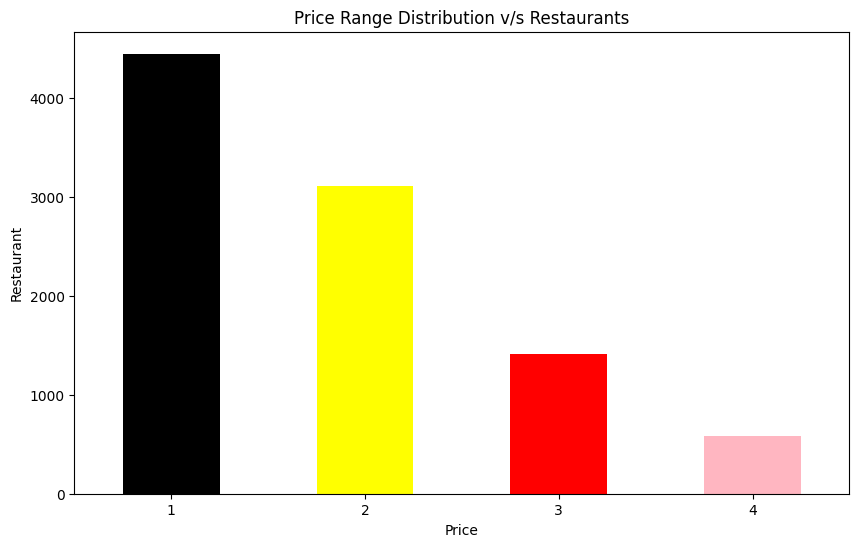

In [ ]:
colors = ['black','yellow','red','lightpink']
plt.figure(figsize=(10, 6))
df['Price range'].value_counts().sort_index().plot(kind='bar', color=colors)
plt.title('Price Range Distribution v/s Restaurants')
plt.xlabel('Price')
plt.ylabel('Restaurant')
plt.xticks(rotation=0)
plt.show()

 #Calculate the percentage of restaurants in each price range category

In [ ]:
price_range_percentage = (df['Price range'].value_counts(normalize=True) * 100).sort_index()

print("\n* Percentage of Restaurants in Each Price Range Category -")
for price_range, percentage in price_range_percentage.iteritems():
    print(f"  Price Range {price_range} - {percentage:.2f}%")


* Percentage of Restaurants in Each Price Range Category -
  Price Range 1 - 46.53%
  Price Range 2 - 32.59%
  Price Range 3 - 14.74%
  Price Range 4 - 6.14%


**Task 4 : Online Delivery**

 #Determine the percentage of restaurants that offer online delivery

In [ ]:
online_delivery_percentage = (df['Has Online delivery'].value_counts(normalize=True) * 100).get('Yes', 0)
print(f"Percentage of Restaurants Offering Online Delivery - {online_delivery_percentage:.2f}%")

Percentage of Restaurants Offering Online Delivery - 25.66%


 #Compare the average ratings of restaurants with and without online delivery

In [ ]:
average_rating_with_delivery = df[df['Has Online delivery'] == 'Yes']['Aggregate rating'].mean()
print(f"\n(1) Average Rating of Restaurants with Online Delivery - {average_rating_with_delivery:.2f}")

average_rating_without_delivery = df[df['Has Online delivery'] == 'No']['Aggregate rating'].mean()
print(f"\n(2) nAverage Rating of Restaurants without Online Delivery - {average_rating_without_delivery:.2f}")


(1) Average Rating of Restaurants with Online Delivery - 3.25

(2) nAverage Rating of Restaurants without Online Delivery - 2.47


# **Level 2**

**Task 1 : Restaurant Ratings**

 #Analyze the distribution of aggregate ratings and determine the most common rating range

In [ ]:
rating_counts = df['Aggregate rating'].value_counts().sort_index(ascending=False)
most_common_rating_range = rating_counts.idxmax()
print(f"Most Common Rating Range - {most_common_rating_range}")

Most Common Rating Range - 0.0


 #Calculate the average number of votes received by restaurants

In [ ]:
average_votes = df['Votes'].mean()
print(f"\nAverage Number of Votes Received by Restaurants - {average_votes:.2f}")


Average Number of Votes Received by Restaurants - 156.91


**Task 2 : Cuisine Combination**

 #Identify the most common combinations of cuisines in the dataset

 #Determine if certain cuisine combinations tend to have higher ratings.

In [ ]:
# Extract unique cuisine combinations
unique_combinations = df['Cuisines'].str.split(', ').explode().unique()

# Create a new DataFrame to store the combinations and their counts
combination_counts = pd.DataFrame(columns=['Combination', 'Count', 'Average Rating'])

# Iterate over unique combinations and calculate counts and average ratings
for combination in unique_combinations:
    combination_filter = df['Cuisines'].apply(lambda x: str(combination).lower() in str(x).lower() if pd.notna(x) else False)
    combination_count = combination_filter.sum()
    average_rating = df.loc[combination_filter, 'Aggregate rating'].mean()

    combination_counts = combination_counts.append({
        'Combination': combination,
        'Count': combination_count,
        'Average Rating': average_rating
    }, ignore_index=True)

# Sort the DataFrame by count in descending order
combination_counts = combination_counts.sort_values(by='Count', ascending=False)

print("Most Common Cuisine Combinations:")
print(combination_counts[['Combination', 'Count']])


print("\nAverage Ratings for Cuisine Combinations:")
print(combination_counts[['Combination', 'Average Rating']])

Most Common Cuisine Combinations:
        Combination Count
6            Indian  4259
82     North Indian  3960
9           Chinese  2733
19        Fast Food  1987
83          Mughlai   994
..              ...   ...
121         Malwani     1
122  Cuisine Varies     1
68        Soul Food     1
145        Bï¿½_rek     1
38              NaN   0.0

[146 rows x 2 columns]

Average Ratings for Cuisine Combinations:
        Combination  Average Rating
6            Indian        2.525053
82     North Indian        2.510455
9           Chinese        2.620234
19        Fast Food        2.563966
83          Mughlai        2.612575
..              ...             ...
121         Malwani        3.500000
122  Cuisine Varies        0.000000
68        Soul Food        3.600000
145        Bï¿½_rek        4.700000
38              NaN             NaN

[146 rows x 2 columns]


**Task 3 : Geographic Analysis**

In [ ]:
import folium
from folium.plugins import MarkerCluster

# Filter out rows with missing latitude or longitude values
df = df.dropna(subset=['Latitude', 'Longitude'])

# Create a map centered around the average latitude and longitude
average_latitude = df['Latitude'].mean()
average_longitude = df['Longitude'].mean()
restaurant_map = folium.Map(location=[average_latitude, average_longitude], zoom_start=12)

# Create a MarkerCluster to group nearby markers
marker_cluster = MarkerCluster().add_to(restaurant_map)

# Add markers for each restaurant
for index, row in df.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']],
                  popup=row['Restaurant Name']).add_to(marker_cluster)

restaurant_map.save('restaurant_map.html')
restaurant_map

**Task 4 : Restaurant Chains**

 #Identify if there are any restaurant chains present in the dataset

In [ ]:
restaurant_chains = df['Restaurant Name'].value_counts()
chains = restaurant_chains[restaurant_chains > 1].index
chain_df = df[df['Restaurant Name'].isin(chains)].copy()


In [ ]:
# Analyze ratings and popularity of different restaurant chains
chain_analysis = chain_df.groupby('Restaurant Name').agg({'Aggregate rating':'mean','Votes':'sum','Average Cost for two':'mean'}).sort_values(by='Votes', ascending=False)
print("Restaurant Chains Analysis:")

print(chain_analysis)

Restaurant Chains Analysis:
                           Aggregate rating  Votes  Average Cost for two
Restaurant Name                                                         
Barbeque Nation                    4.353846  28142           1498.076923
AB's - Absolute Barbecues          4.825000  13400           1500.000000
Big Chill                          4.475000  10853           1500.000000
Farzi Cafe                         4.366667  10098           1516.666667
Truffles                           3.950000   9682            550.000000
...                                     ...    ...                   ...
Bikaner Misthan Bhandar            0.000000      0            250.000000
Aap Ki Khatir                      0.000000      0            400.000000
Street Cafe                        0.000000      0            300.000000
Jyoti Sweets                       0.000000      0            200.000000
Firangi Bake                       0.000000      0            300.000000

[734 rows x 3 columns]

#  **Level 3**

**Task 1 : Restaurant Reviews**

 #Analyze the text reviews to identify the most common positive and negative keywords

In [ ]:
from collections import Counter
import re

def clean_text(text):
    # Remove special characters and convert to lowercase
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    text = text.lower()
    return text

def analyze_reviews(reviews):
    positive_keywords = []
    negative_keywords = []

    for review in reviews:
        cleaned_review = clean_text(review)
        words = cleaned_review.split()

        # Add positive keywords
        positive_words = [word for word in words if word in positive_words_list]
        positive_keywords.extend(positive_words)

        # Add negative keywords
        negative_words = [word for word in words if word in negative_words_list]
        negative_keywords.extend(negative_words)

    return Counter(positive_keywords), Counter(negative_keywords)

def display_results(positive_counter, negative_counter, n=10):
    print("Most common positive keywords:")
    for word, count in positive_counter.most_common(n):
        print(f"{word}: {count} times")

    print("\nMost common negative keywords:")
    for word, count in negative_counter.most_common(n):
        print(f"{word}: {count} times")

# Sample positive and negative words list
positive_words_list = ["good", "great", "excellent", "awesome", "amazing", "love", "fantastic"]
negative_words_list = ["bad", "terrible", "horrible", "awful", "poor", "disappointing"]

# Sample reviews
reviews = [
    "I love this product, it's amazing!",
    "The quality of the service was poor.",
    "The movie was terrible, I regret watching it.",
    "This restaurant has fantastic food and service.",
    "The customer support was awful, I won't be using this service again."
]

positive_counter, negative_counter = analyze_reviews(reviews)
display_results(positive_counter, negative_counter)

Most common positive keywords:
love: 1 times
amazing: 1 times
fantastic: 1 times

Most common negative keywords:
poor: 1 times
terrible: 1 times
awful: 1 times


 #Calculate the average length of reviews and explore if there is a relationship between review length and rating

In [ ]:
import numpy as np

def calculate_average_review_length(reviews):
    review_lengths = [len(review.split()) for review in reviews]
    average_length = np.mean(review_lengths)
    return average_length

def analyze_review_length_and_rating(reviews, ratings):
    review_lengths = [len(review.split()) for review in reviews]
    length_rating_data = list(zip(review_lengths, ratings))
    return length_rating_data

def display_average_review_length(average_length):
    print(f"Average length of reviews: {average_length:.2f} words")

def display_review_length_rating_relationship(length_rating_data):
    print("\nReview length and rating relationship:")
    for length, rating in length_rating_data:
        print(f"Review length - {length} words, Rating - {rating}")

# Sample reviews and ratings
reviews = [
    "I love this product, it's amazing!",
    "The quality of the service was poor.",
    "The movie was terrible, I regret watching it.",
    "This restaurant has fantastic food and service.",
    "The customer support was awful, I won't be using this service again."
]
ratings = [5, 2, 1, 5, 1]

# Calculate average review length
average_length = calculate_average_review_length(reviews)
display_average_review_length(average_length)

# Analyze review length and rating relationship
length_rating_data = analyze_review_length_and_rating(reviews, ratings)
display_review_length_rating_relationship(length_rating_data)


Average length of reviews: 8.00 words

Review length and rating relationship:
Review length - 6 words, Rating - 5
Review length - 7 words, Rating - 2
Review length - 8 words, Rating - 1
Review length - 7 words, Rating - 5
Review length - 12 words, Rating - 1


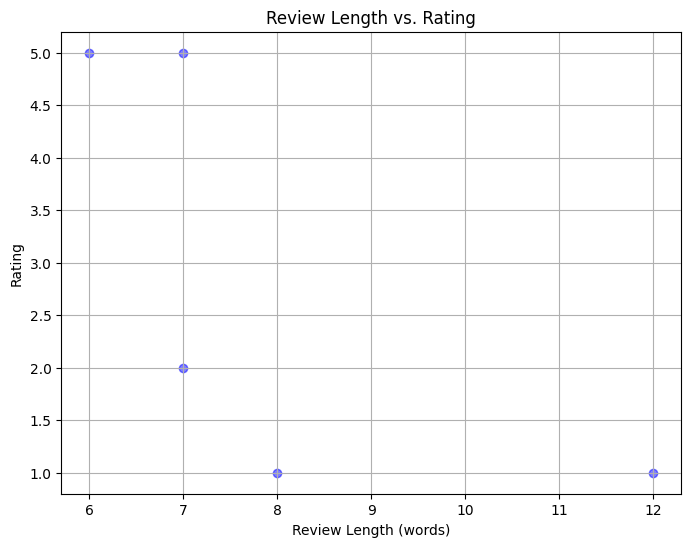

In [ ]:
import matplotlib.pyplot as plt

def plot_review_length_rating_relationship(length_rating_data):
    lengths, ratings = zip(*length_rating_data)
    plt.figure(figsize=(8, 6))
    plt.scatter(lengths, ratings, color='blue', alpha=0.5)
    plt.title('Review Length vs. Rating')
    plt.xlabel('Review Length (words)')
    plt.ylabel('Rating')
    plt.grid(True)
    plt.show()

# Plot review length and rating relationship
plot_review_length_rating_relationship(length_rating_data)

**Task 2 : Votes Analysis**

 #Identify the restaurants with the highest and lowest number of votes

In [ ]:
highest_votes_restaurant = df.loc[df['Votes'].idxmax()]
print("Restaurant with the Highest Number of Votes -")
print(highest_votes_restaurant[['Restaurant Name' , 'Votes', 'Aggregate rating']])


Restaurant with the Highest Number of Votes -
Restaurant Name      Toit
Votes               10934
Aggregate rating      4.8
Name: 728, dtype: object


In [ ]:
lowest_votes_restaurant = df.loc[df['Votes'].idxmin()]
print("\nRestaurant with the Lowest Number of Votes -")
print(lowest_votes_restaurant[['Restaurant Name', 'Votes', 'Aggregate rating']])



Restaurant with the Lowest Number of Votes -
Restaurant Name     Cantinho da Gula
Votes                              0
Aggregate rating                 0.0
Name: 69, dtype: object


 #Analyze if there is a correlation between the number of votes and the rating of a restaurant

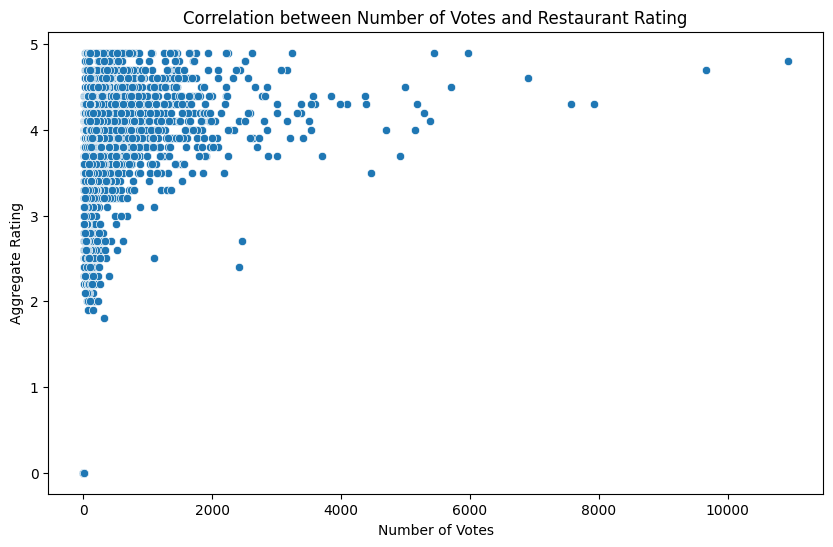


Correlation Coefficient between Votes and Rating - 0.31369058419541157


In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Votes', y='Aggregate rating', data=df)
plt.title('Correlation between Number of Votes and Restaurant Rating')
plt.xlabel('Number of Votes')
plt.ylabel('Aggregate Rating')
plt.show()

# Calculate correlation coefficient
correlation_coefficient = df['Votes'].corr(df['Aggregate rating'])
print(f"\nCorrelation Coefficient between Votes and Rating - {correlation_coefficient}")

**Task 3 : Price Range vs. Online Delivery and Table Booking**

 #Analyze if there is a relationship between the price range and the availability of online delivery and table booking

 #Determine if higher-priced restaurants are more likely to offer these services

Unique Price Range Values: [3 4 2 1]


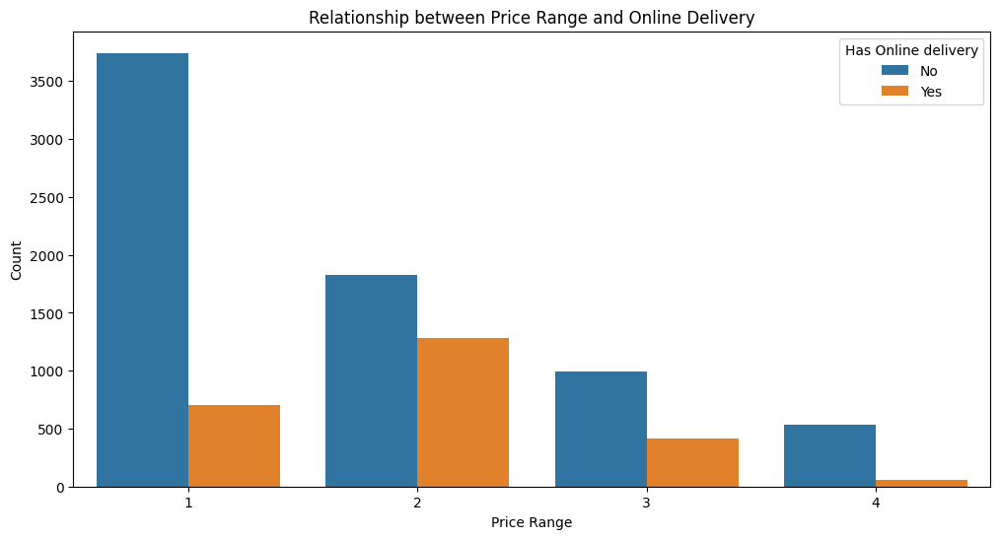

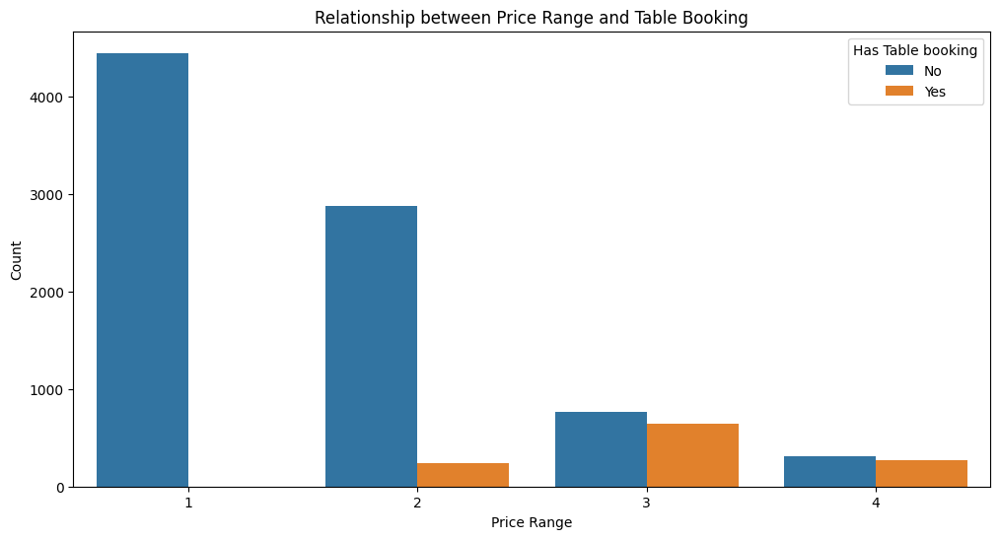

In [ ]:
print("Unique Price Range Values:", df['Price range'].unique())

# Replace the '$' signs in the 'Price Range' column with numeric values
df['Price range'] = df['Price range'].replace({'$': 1, '$$': 2, '$$$': 3, '$$$$': 4})

# Analyze the relationship between price range and online delivery
plt.figure(figsize=(12, 6))
sns.countplot(x='Price range', hue='Has Online delivery', data=df)
plt.title('Relationship between Price Range and Online Delivery')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.show()

# Analyze the relationship between price range and table booking
plt.figure(figsize=(12, 6))
sns.countplot(x='Price range', hue='Has Table booking', data=df)
plt.title('Relationship between Price Range and Table Booking')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.show()